# Data integration with Lush et al
## Our 10X data supports the idea that our UHCPs (hair cell progenitors) and the progenitor cells from Lush et al study are similar at a transcriptional level and we show our comparison in this notebook

# Prerequisites

In [1]:
import numpy as np
import pandas as pd
import scanpy.api as sc
import seaborn as sb
import matplotlib.pyplot as plt
import scrublet as scr
import MulticoreTSNE
import os
import glob
import diffxpy.api as de

sc.logging.print_versions()
sc.set_figure_params(dpi=150, frameon=False,
    fontsize=15,
    transparent=False,)

/home/icb/subarna.palit/tmp/anaconda3/lib/python3.7/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.16.4 scipy==1.3.0 pandas==0.24.2 scikit-learn==0.21.2 statsmodels==0.10.0 python-igraph==0.7.1 louvain==0.6.1


# Load raw data from GEO for Lush et al study

In [27]:
lush_ad = sc.read_10x_h5('./GSM3498552_filtered_gene_bc_matrices_WT.h5')
lush_ad
# Initial gene quality control was performed by filtering out genes expressed in less than 3 cells for the WT data set
sc.pp.filter_genes(lush_ad, min_cells = 3)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 1666 × 32105 
    var: 'gene_ids'

# Load merged 10X neuromast cells following standard Scanpy processing

In [29]:
adata = sc.read("./merged_adata_hair_support_cells_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 1167 × 14645 
    obs: 'batch', 'log_counts', 'mt_frac', 'n_counts', 'n_genes', 'sample', 'doublet_scores', 'louvain'
    var: 'n_cells', 'highly_variable_genes', 'expression_mean', 'dispersion'
    uns: 'dendrogram_louvain', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [31]:
adata.X = adata.layers['counts'].A # reverting back to raw counts

In [1]:
adata.obs['dataset'] = 'Eva at al'

In [38]:
lush_ad.obs['dataset'] = 'Lush et al'
lush_ad.obs['louvain'] = bdata_lush.obs['louvain_new'].values

In [41]:
lush_ad.X = lush_ad.X.A

In [ ]:
# Merge datasets
merged_ad = adata.concatenate(lush_ad, join='outer') # outer because # genes do not match
merged_ad
merged_ad.X = np.array(pd.DataFrame(merged_ad.X).fillna(0)) # replacing nans with zeros
merged_ad.X

# Normalization

In [46]:
# The remaining UMI counts are then log normalized
merged_ad.layers["counts"] = merged_ad.X.copy()
sc.pp.normalize_per_cell(merged_ad, counts_per_cell_after=1e4)
sc.pp.log1p(merged_ad)
merged_ad.raw = merged_ad

# Calculate highly variable genes

Number of highly variable genes: 3999


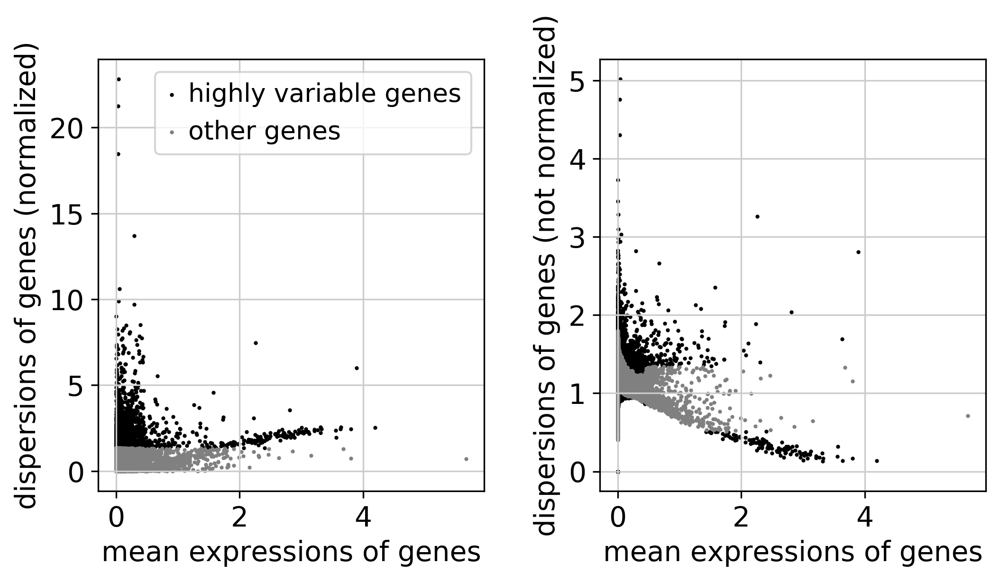

,n_cells-0,highly_variable_genes-0,expression_mean-0,dispersion-0,gene_ids-1,n_cells-1,highly_variable_genes,expression_mean,dispersion
ptpn12,1057.0,False,0.053057,0.553750,NaN,NaN,True,0.014666,0.932223
dusp16,405.0,False,0.021942,0.655791,ENSDARG00000102474,47.0,False,0.040449,1.327383
crebl2,1671.0,False,0.090949,0.590392,ENSDARG00000104049,76.0,False,0.087965,1.096490
gpr19,682.0,False,0.036309,0.635527,ENSDARG00000102226,22.0,False,0.034457,1.112499
tbk1,1634.0,False,0.094328,0.623283,ENSDARG00000103095,206.0,False,0.149120,1.179050


In [47]:
disp_filter = sc.pp.filter_genes_dispersion(merged_ad.X, flavor='cell_ranger',
                                                min_mean=0.001, n_top_genes=4000, log=False)

print('Number of highly variable genes: {:d}'.format(merged_ad[:, disp_filter['gene_subset']].n_vars))
merged_ad.var['highly_variable_genes'] = disp_filter['gene_subset']
merged_ad.var['expression_mean'] = disp_filter['means']
merged_ad.var['dispersion'] = disp_filter['dispersions']
sc.pl.filter_genes_dispersion(disp_filter)
merged_ad.var.head()

# Calculate embeddings

In [55]:
import bbknn
sc.pp.pca(merged_ad, svd_solver='arpack')
bdata = bbknn.bbknn(merged_ad, batch_key='dataset',copy=True, n_pcs = 60)

# Supplementary figures 2C,D

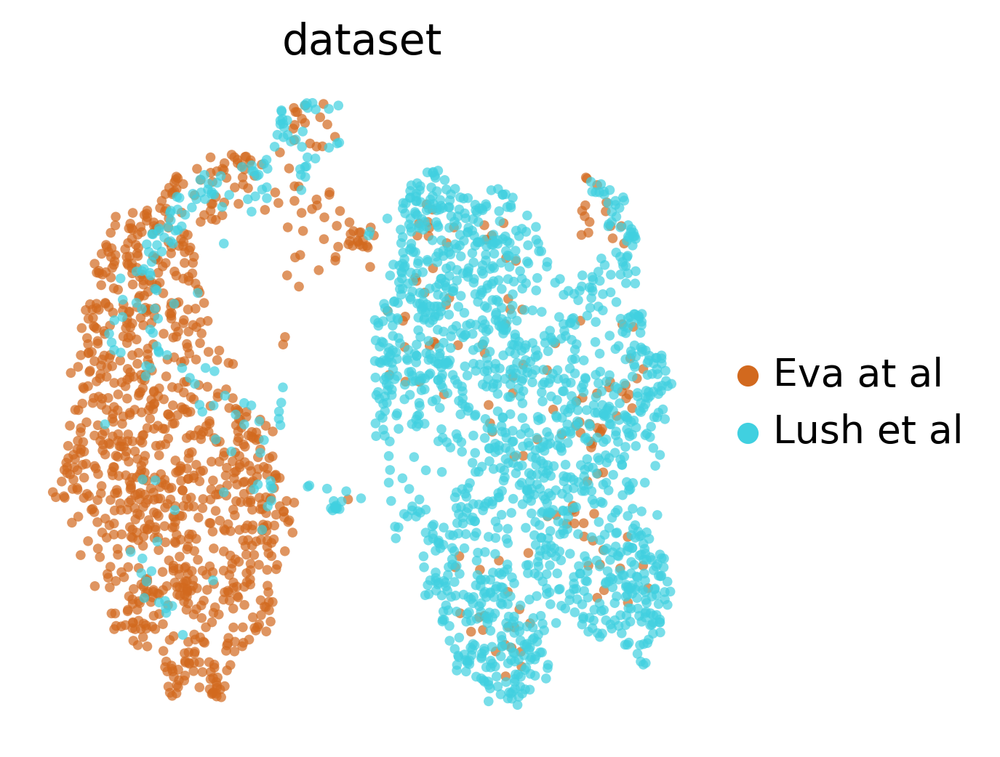

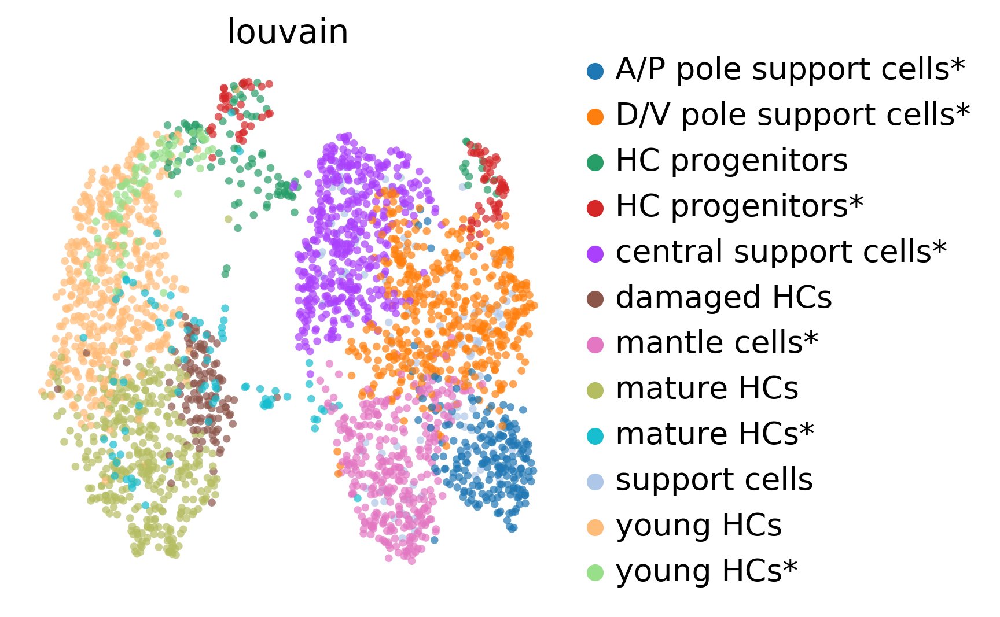

In [94]:
sc.tl.umap(bdata)
bdata.uns['dataset_colors'] = ['#D2691E','#40D0E0']
sc.pl.umap(bdata,color=['dataset'], alpha = .7, wspace = 0.4, save = 'merged_dataset.pdf')
sc.pl.umap(bdata,color=['louvain'], alpha = .7, wspace = 0.4, save = 'merged_louvain.pdf')

# Supplementary figure 2E

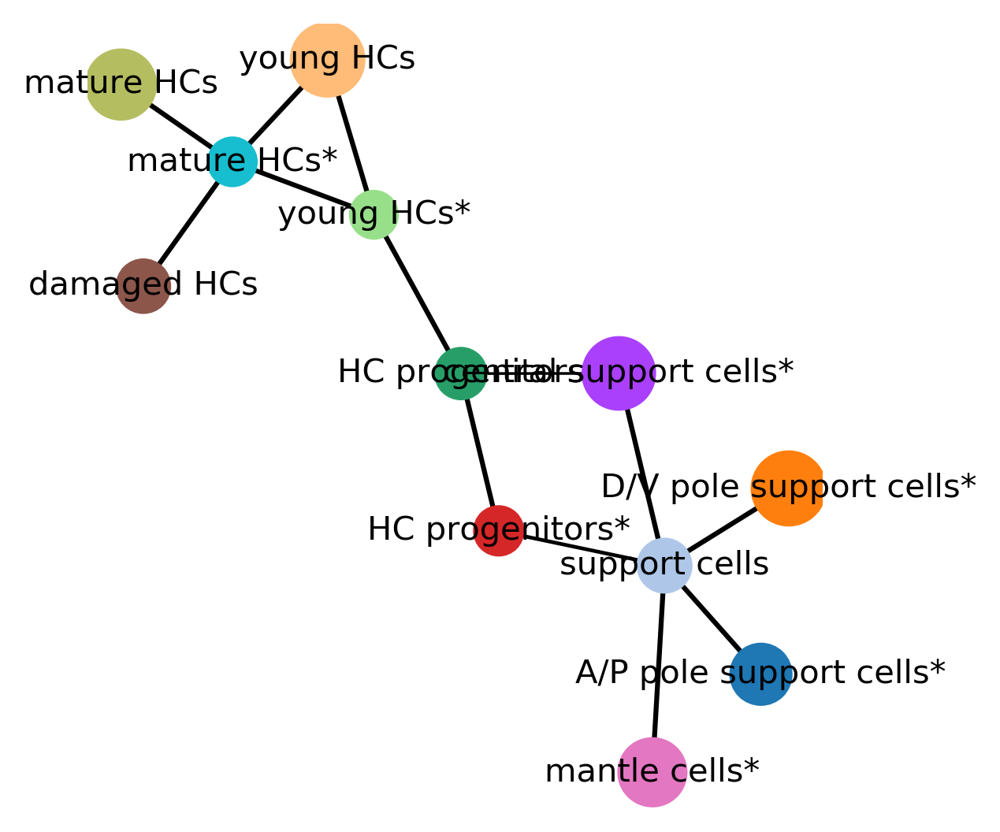

In [92]:
sc.tl.paga(bdata)
sc.pl.paga(bdata, threshold=0.5, layout= 'fa', color = 'louvain', fontweight = 1, root = 0, arrowsize = 7, edge_width_scale=0.2, fontsize=10, frameon = False, node_size_scale=2, save = '.pdf')

In [109]:
bdata_tmp = bdata.copy()
print(bdata_tmp.obs['louvain'].cat.categories)
bdata_tmp.obs['louvain'] = bdata_tmp.obs['louvain'].cat.reorder_categories(['damaged HCs', 'mature HCs*','mature HCs','young HCs*','young HCs','HC progenitors*','HC progenitors',
                                            'central support cells*','support cells','A/P pole support cells*', 'D/V pole support cells*','mantle cells*'])

Index(['A/P pole support cells*', 'D/V pole support cells*', 'HC progenitors',
       'HC progenitors*', 'central support cells*', 'damaged HCs',
       'mantle cells*', 'mature HCs', 'mature HCs*', 'support cells',
       'young HCs', 'young HCs*'],
      dtype='object')


# Supplementary figure 2F

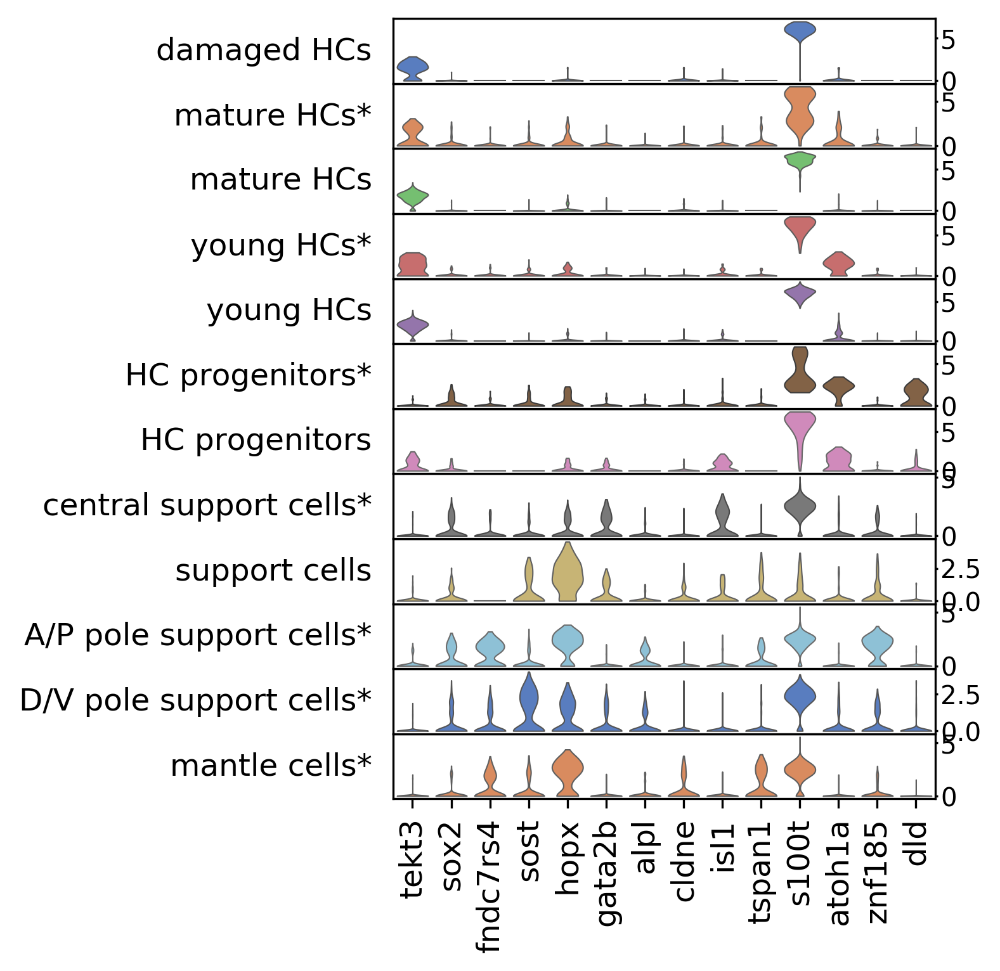

In [112]:
sc.pl.stacked_violin(bdata_tmp, var_names=['tekt3','sox2', 'fndc7rs4', 'sost', 'hopx', 'gata2b', 'alpl', 'cldne', 'isl1','tspan1','s100t','atoh1a','znf185','dld'], groupby='louvain', save = '.pdf')

In [113]:
# sc.pl.dotplot(bdata, var_names=['tekt3','sox2', 'fndc7rs4', 'sost', 'hopx', 'gata2b', 'alpl', 'cldne', 'isl1','tspan1','s100t','atoh1a','znf185','dld'], groupby='louvain')

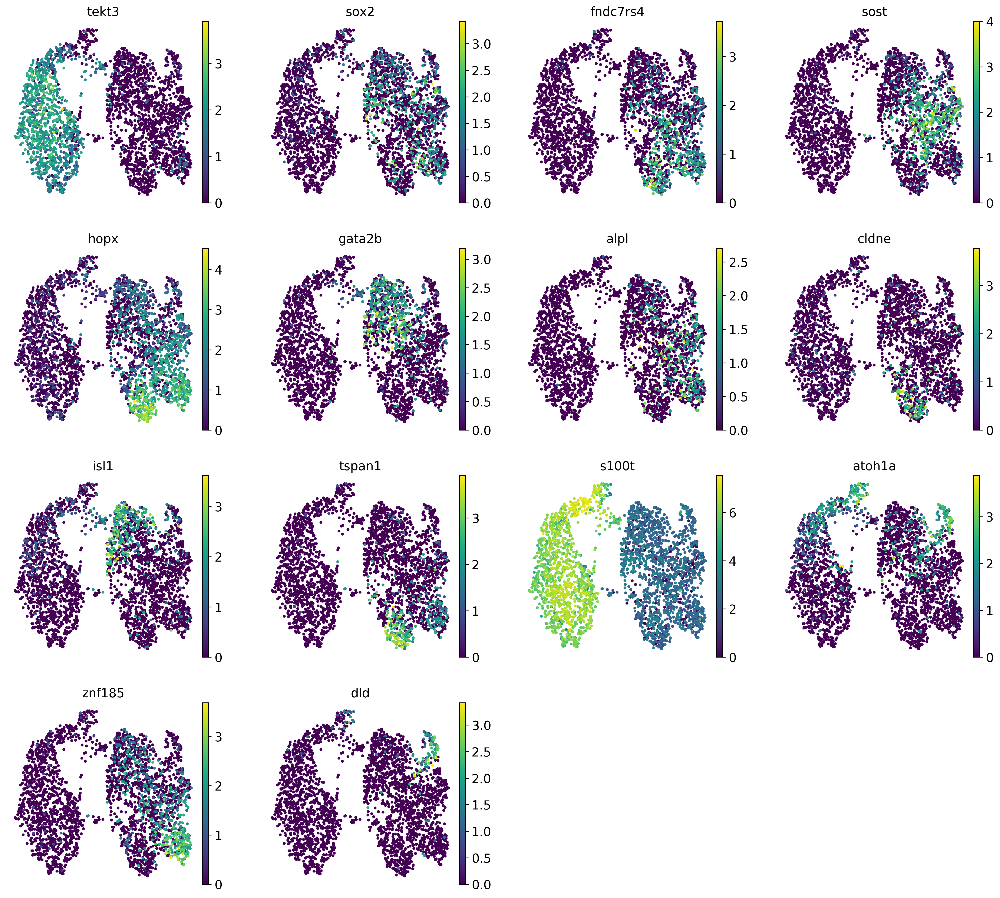

In [97]:
sc.pl.umap(bdata,color=['tekt3','sox2', 'fndc7rs4', 'sost', 'hopx', 'gata2b', 'alpl', 'cldne', 'isl1','tspan1','s100t','atoh1a','znf185','dld'])

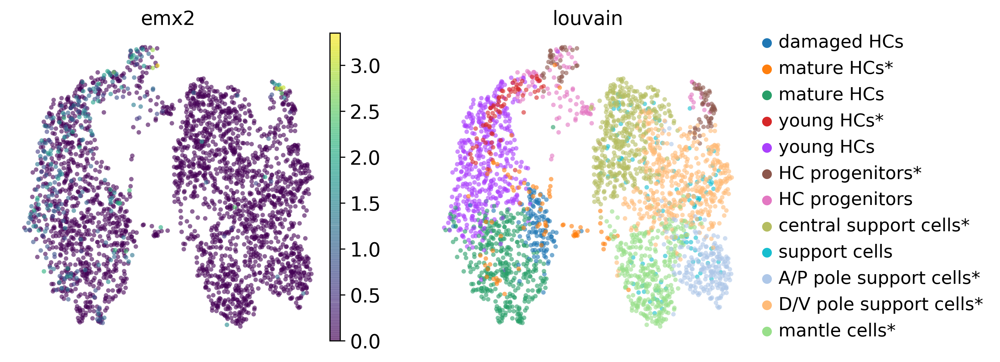

In [117]:
sc.pl.umap(bdata_tmp, color = ['emx2','louvain'], alpha = 0.6)

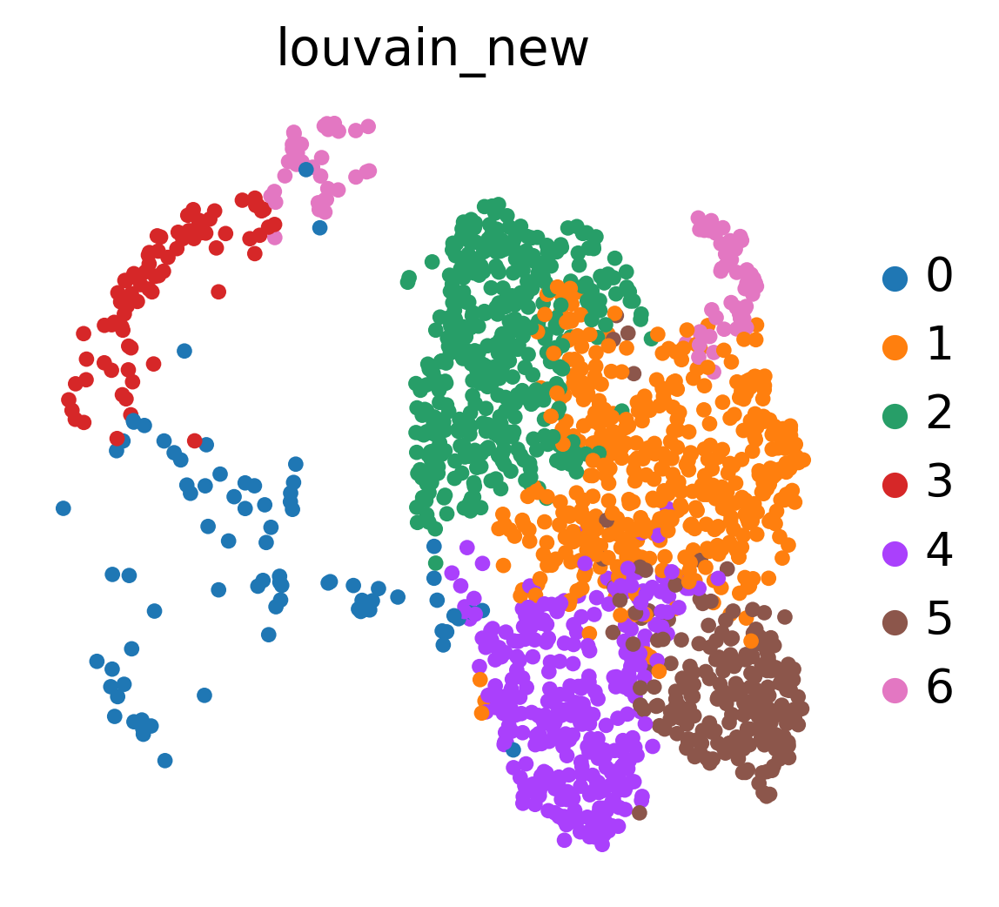

In [25]:
bdata_lush = bdata[bdata.obs['dataset']=='Lush et al'].copy()
sc.pl.umap(bdata_lush, color = 'louvain_new')

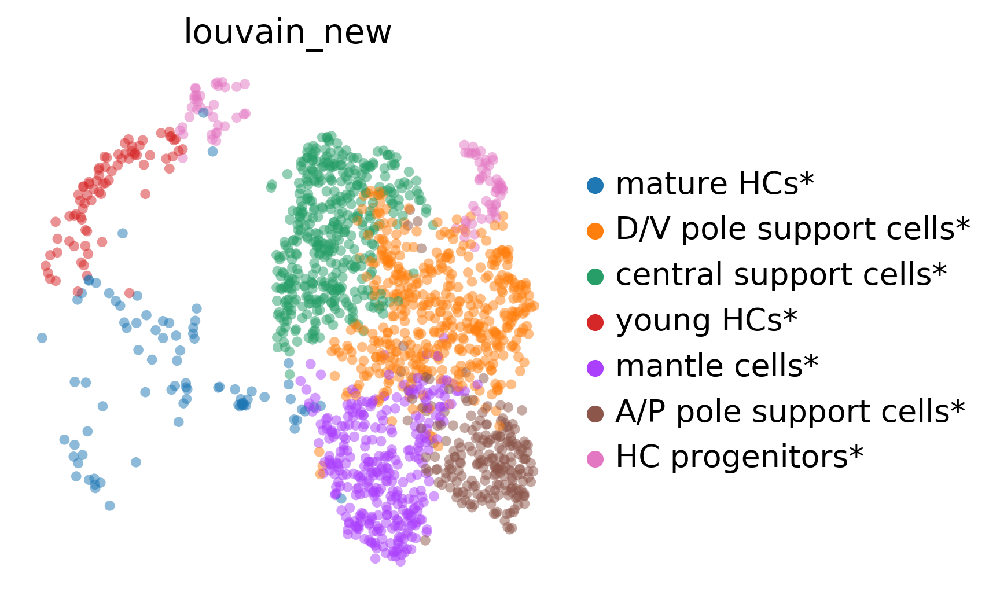

In [26]:
# 0 - mature hair cells
# 1 - D/V pole support cells
# 2 - central support cells
# 3 - young hair cells
# 4 - mantle cells
# 5 - A/P pole support cells
# 6 - UHCPs

new_groups = ['mature HCs*','D/V pole support cells*','central support cells*','young HCs*','mantle cells*','A/P pole support cells*','HC progenitors*']
# len(new_groups)
bdata_lush.rename_categories('louvain_new',new_groups)
sc.pl.umap(bdata_lush, color = 'louvain_new', alpha = .5)

In [153]:
bdata_lush.obs['louvain'].cat.categories

Index(['mature HCs*', 'D/V pole support cells*', 'central support cells*',
       'young HCs*', 'mantle cells*', 'A/P pole support cells*',
       'HC progenitors*'],
      dtype='object')

In [84]:
bdata_lush.obs_names

Index(['AAACCTGAGCACCGCT-1-1', 'AAACCTGCACATTCGA-1-1', 'AAACCTGCAGGGTTAG-1-1',
       'AAACCTGCATGCCTTC-1-1', 'AAACCTGGTTGAACTC-1-1', 'AAACCTGTCACCTTAT-1-1',
       'AAACCTGTCCTGCCAT-1-1', 'AAACGGGTCCACGTGG-1-1', 'AAAGATGCAAGGACTG-1-1',
       'AAAGATGCACGAAATA-1-1',
       ...
       'TTTGCGCAGCAGCGTA-1-1', 'TTTGCGCCAGTAAGAT-1-1', 'TTTGGTTAGATGCCTT-1-1',
       'TTTGGTTCAAGTCATC-1-1', 'TTTGGTTCAGGACGTA-1-1', 'TTTGGTTCAGGGAGAG-1-1',
       'TTTGTCAAGGCGATAC-1-1', 'TTTGTCACAGGTGGAT-1-1', 'TTTGTCATCGTCACGG-1-1',
       'TTTGTCATCTGAAAGA-1-1'],
      dtype='object', length=1666)

In [96]:
lush_ad.obs['louvain'] = bdata_lush.obs['louvain_new'].values

In [97]:
lush_ad.obs['louvain']

AAACCTGAGCACCGCT-1     central support cells
AAACCTGCACATTCGA-1     central support cells
AAACCTGCAGGGTTAG-1    D/V pole support cells
AAACCTGCATGCCTTC-1    A/P pole support cells
AAACCTGGTTGAACTC-1    A/P pole support cells
AAACCTGTCACCTTAT-1     central support cells
AAACCTGTCCTGCCAT-1              mantle cells
AAACGGGTCCACGTGG-1    D/V pole support cells
AAAGATGCAAGGACTG-1    A/P pole support cells
AAAGATGCACGAAATA-1    D/V pole support cells
AAAGATGCATCGATTG-1     central support cells
AAAGATGGTACACCGC-1    D/V pole support cells
AAAGATGGTCTTTCAT-1     central support cells
AAAGCAAAGATGCCAG-1    A/P pole support cells
AAAGCAACACAGATTC-1              mantle cells
AAAGCAACACGGCGTT-1              mantle cells
AAAGCAACATGAAGTA-1    D/V pole support cells
AAAGCAATCGTAGATC-1    A/P pole support cells
AAAGTAGAGAATAGGG-1              mantle cells
AAAGTAGAGGTCATCT-1                     UHCPs
AAAGTAGGTAAGTGGC-1    A/P pole support cells
AAAGTAGGTGCAGACA-1          young hair cells
AAAGTAGTCA

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Number of highly variable genes: 4000


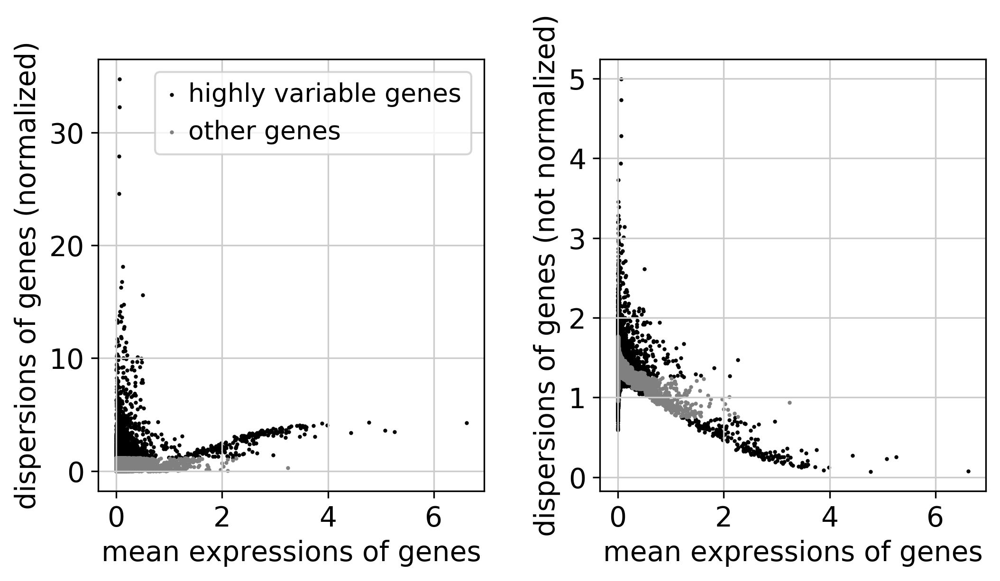

,gene_ids,n_cells,highly_variable_genes,expression_mean,dispersion
rpl24,ENSDARG00000099104,1598,True,2.760175,0.235969
cep97,ENSDARG00000102407,59,False,0.042682,1.301328
nfkbiz,ENSDARG00000102097,12,False,0.010524,1.498281
eed,ENSDARG00000099640,115,False,0.086327,1.298296
zgc:110091,ENSDARG00000104071,221,False,0.170561,1.245972


In [35]:
# Resolving clusters for  Lush et al as annotations not available:
lush_ad = sc.read_10x_h5('/home/icb/subarna.palit/projects/data_analyses/mcSRBBseq_Enard_LS/GSM3498552_filtered_gene_bc_matrices_WT.h5')

# Initial gene quality control was performed by filtering out genes expressed in less than 3 cells for the WT data set:
sc.pp.filter_genes(lush_ad, min_cells = 3)

# The remaining UMI counts were then log normalized:
lush_ad.layers["counts"] = lush_ad.X.copy()
sc.pp.normalize_per_cell(lush_ad, counts_per_cell_after=1e4)
sc.pp.log1p(lush_ad)
lush_ad.raw = lush_ad
lush_ad

# Gene selection for dimensional reduction was accomplished using the Seurat function FindVariableGenes() 
# with the following arguments for the WT data set: x.low.cutoff = 0.001, x.high.cutoff = 3.0, and y.cutoff = 0.5;
# Calculate highly variable genes:
disp_filter = sc.pp.filter_genes_dispersion(lush_ad.X, flavor='cell_ranger',
                                                min_mean=0.001, n_top_genes=4000, log=False)

print('Number of highly variable genes: {:d}'.format(lush_ad[:, disp_filter['gene_subset']].n_vars))
lush_ad.var['highly_variable_genes'] = disp_filter['gene_subset']
lush_ad.var['expression_mean'] = disp_filter['means']
lush_ad.var['dispersion'] = disp_filter['dispersions']
sc.pl.filter_genes_dispersion(disp_filter)
lush_ad.var.head()

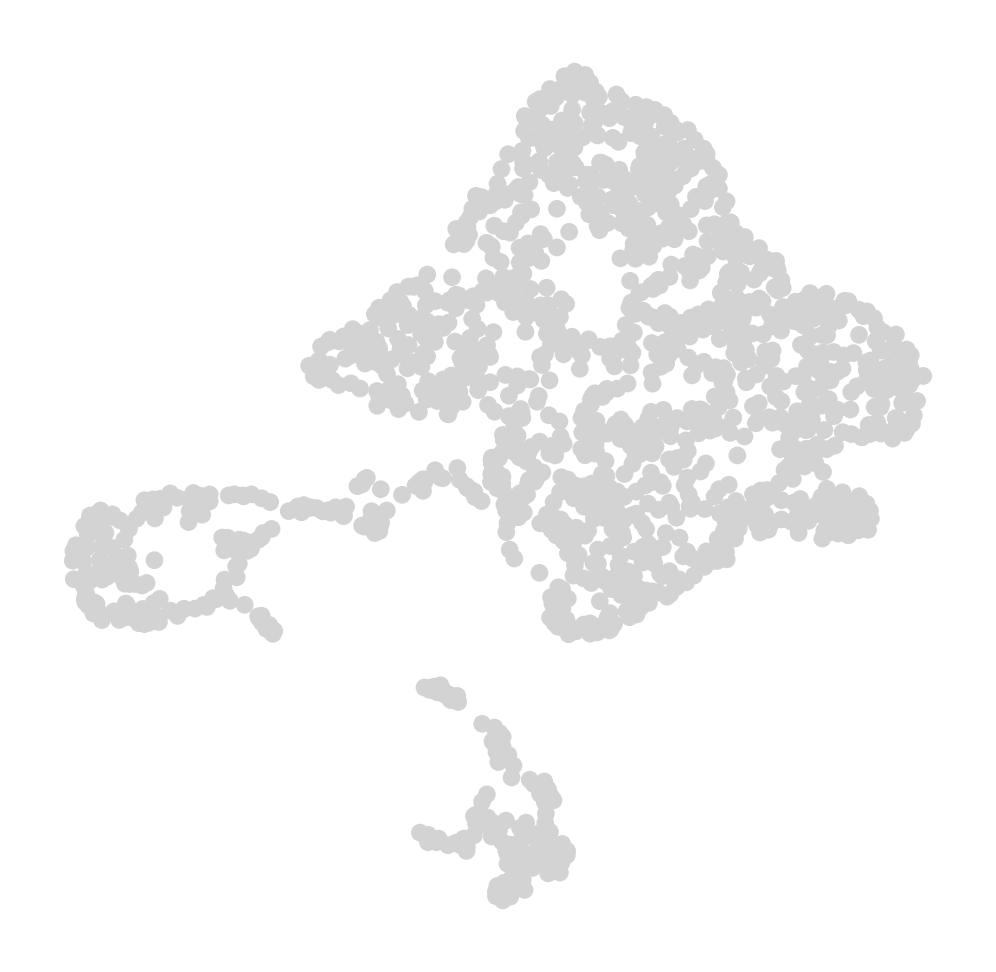

In [55]:
sc.pp.pca(lush_ad, svd_solver='arpack')
# For dimensional reduction, we chose to use the first six principal components (PCs) for wild type:
sc.pp.neighbors(lush_ad, n_neighbors = 10,
    n_pcs = 6,)
sc.tl.umap(lush_ad)
sc.pl.umap(lush_ad)

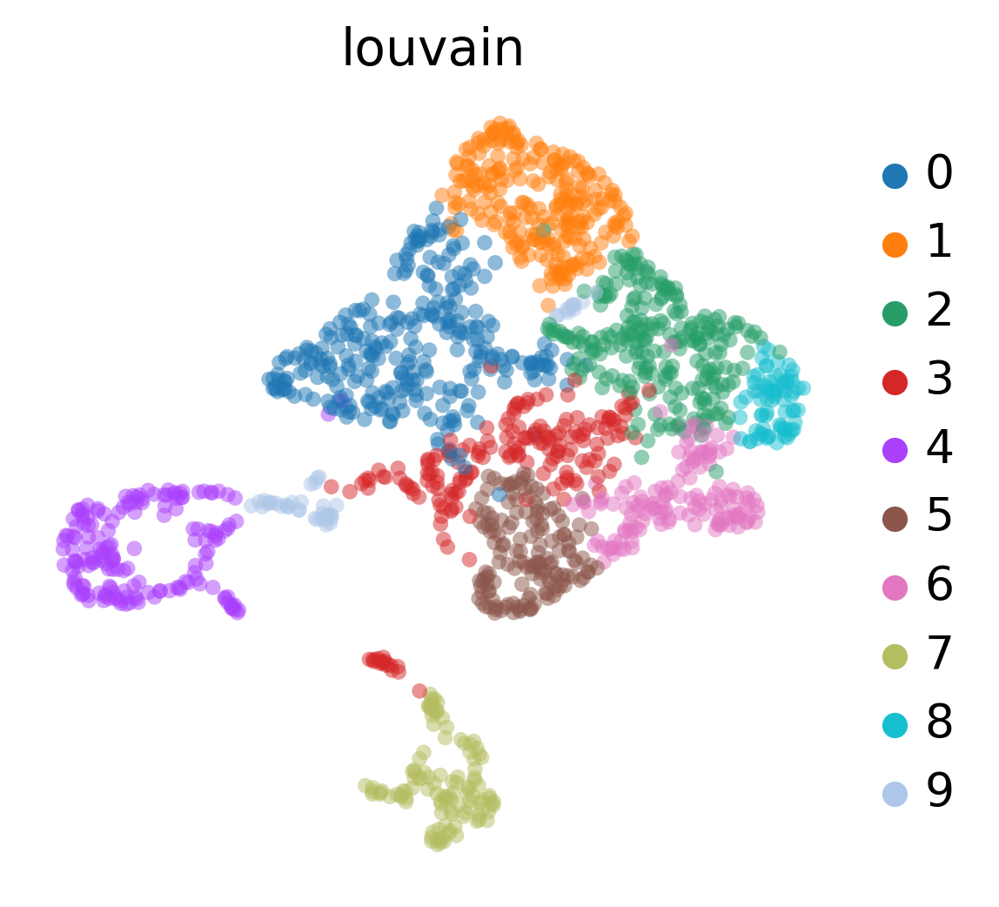

In [58]:
sc.tl.louvain(lush_ad, resolution=0.4, key_added='louvain')
sc.pl.umap(lush_ad,color=['louvain'], alpha = .5, wspace = 0.4)

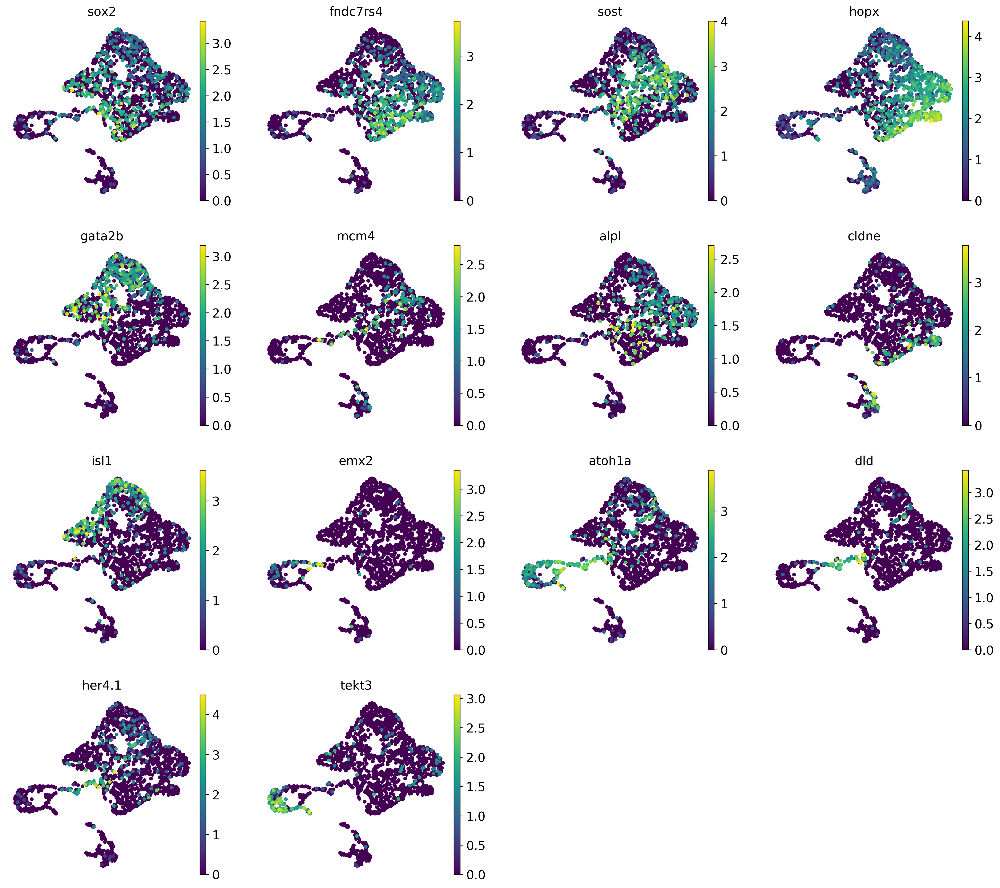

In [57]:
sc.pl.umap(lush_ad, color=['sox2', 'fndc7rs4', 'sost', 'hopx', 'gata2b', 'mcm4', 'alpl', 'cldne', 'isl1','emx2','atoh1a','dld','her4.1','tekt3'])

In [46]:
lush_ad, merged_ad

(AnnData object with n_obs × n_vars = 1666 × 16163 
     obs: 'n_counts', 'louvain'
     var: 'gene_ids', 'n_cells', 'highly_variable_genes', 'expression_mean', 'dispersion'
     uns: 'pca', 'neighbors', 'louvain', 'louvain_colors'
     obsm: 'X_pca', 'X_umap'
     varm: 'PCs'
     layers: 'counts', AnnData object with n_obs × n_vars = 2833 × 19309 
     obs: 'batch', 'dataset', 'doublet_scores', 'log_counts', 'louvain', 'mt_frac', 'n_counts', 'n_genes', 'sample'
     var: 'n_cells-0', 'highly_variable_genes-0', 'expression_mean-0', 'dispersion-0', 'gene_ids-1', 'n_cells-1', 'highly_variable_genes', 'expression_mean', 'dispersion'
     uns: 'pca'
     obsm: 'X_pca'
     varm: 'PCs'
     layers: 'counts')

In [47]:
lush_ad.write('/home/icb/subarna.palit/projects/data_analyses/10x_Zebrafish_Hair_Support_LopezSchier/Lushetal.h5ad')

In [48]:
merged_ad.write('/home/icb/subarna.palit/projects/data_analyses/10x_Zebrafish_Hair_Support_LopezSchier/merged_Lush_eva.h5ad')

... storing 'dataset' as categorical
... storing 'louvain' as categorical
... storing 'sample' as categorical
... storing 'highly_variable_genes-0' as categorical
... storing 'gene_ids-1' as categorical
... storing 'highly_variable_genes-0' as categorical
... storing 'gene_ids-1' as categorical


In [103]:
# merge
merged_ad_1 = adata.concatenate(lush_ad, join='outer') # outer because # genes do not match
merged_ad_1

Making variable names unique for controlled concatenation.
layers concatenation is not yet available for 'outer' intersection and will be ignored.


AnnData object with n_obs × n_vars = 2833 × 19309 
    obs: 'batch', 'dataset', 'doublet_scores', 'log_counts', 'louvain', 'mt_frac', 'n_counts', 'n_genes', 'sample'
    var: 'n_cells-0', 'highly_variable_genes-0', 'expression_mean-0', 'dispersion-0', 'gene_ids-1', 'n_cells-1', 'highly_variable_genes-1', 'expression_mean-1', 'dispersion-1'

In [105]:
merged_ad_1.X = np.array(pd.DataFrame(merged_ad_1.X).fillna(0)) # replacing nans with zeros
merged_ad_1.X

array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 0.       , ..., 3.1465285, 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 1.5411001, ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [106]:
# The remaining UMI counts are then log normalized:
merged_ad_1.layers["counts"] = merged_ad_1.X.copy()
sc.pp.normalize_per_cell(merged_ad_1, counts_per_cell_after=1e4)
sc.pp.log1p(merged_ad_1)
merged_ad_1.raw = merged_ad_1

Number of highly variable genes: 3999


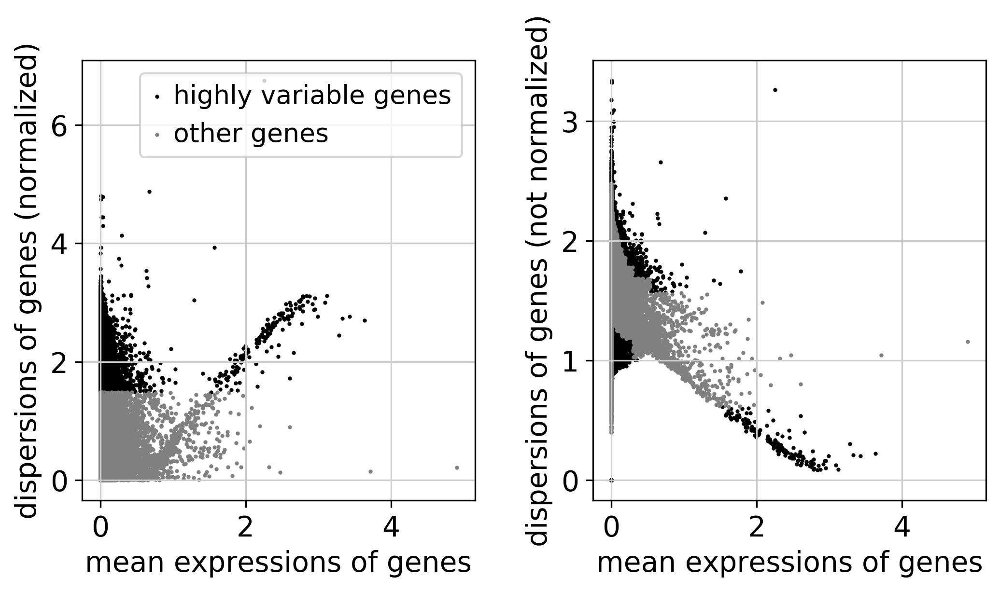

,n_cells-0,highly_variable_genes-0,expression_mean-0,dispersion-0,gene_ids-1,n_cells-1,highly_variable_genes-1,expression_mean-1,dispersion-1,highly_variable_genes,expression_mean,dispersion
ptpn12,1057.0,False,0.053057,0.553750,NaN,NaN,NaN,NaN,NaN,True,0.014666,0.932223
dusp16,405.0,False,0.021942,0.655791,ENSDARG00000102474,47.0,True,0.042198,1.592039,False,0.050290,1.754985
crebl2,1671.0,False,0.090949,0.590392,ENSDARG00000104049,76.0,False,0.058397,1.339466,False,0.104360,1.392232
gpr19,682.0,False,0.036309,0.635527,ENSDARG00000102226,22.0,False,0.017685,1.494512,False,0.039276,1.366604
tbk1,1634.0,False,0.094328,0.623283,ENSDARG00000103095,206.0,False,0.167665,1.307660,False,0.192289,1.577289


In [107]:
# Calculate highly variable genes:
disp_filter = sc.pp.filter_genes_dispersion(merged_ad_1.X, flavor='cell_ranger',
                                                min_mean=0.001, n_top_genes=4000, log=False)

print('Number of highly variable genes: {:d}'.format(merged_ad_1[:, disp_filter['gene_subset']].n_vars))
merged_ad_1.var['highly_variable_genes'] = disp_filter['gene_subset']
merged_ad_1.var['expression_mean'] = disp_filter['means']
merged_ad_1.var['dispersion'] = disp_filter['dispersions']
sc.pl.filter_genes_dispersion(disp_filter)
merged_ad_1.var.head()

In [108]:
import bbknn
sc.pp.pca(merged_ad_1, svd_solver='arpack')
bdata = bbknn.bbknn(merged_ad_1, batch_key='dataset',copy=True)

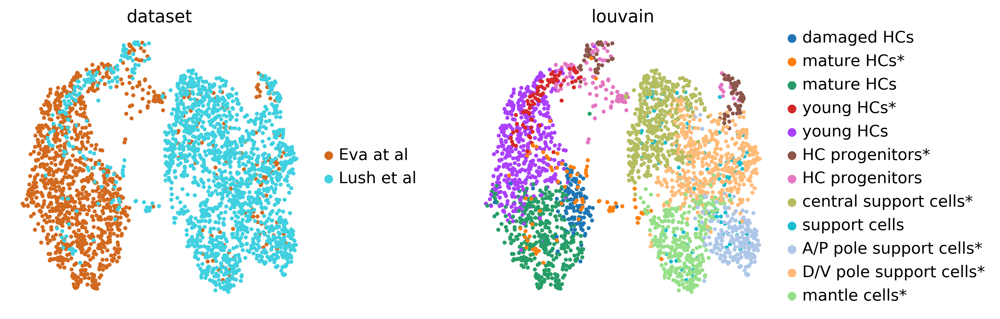

In [120]:
# sc.tl.umap(bdata)
# sc.set_figure_params(dpi = 150, frameon = False)
# bdata.uns['dataset_colors'] = ['#D2691E','#40D0E0']
# sc.set_figure_params(dpi = 150, frameon = False)
sc.pl.umap(bdata_tmp,color=['dataset','louvain'], wspace = 0.4)

In [121]:
bdata_tmp.write('/home/icb/subarna.palit/projects/data_analyses/10x_Zebrafish_Hair_Support_LopezSchier/merged_Lush_eva.h5ad')

... storing 'highly_variable_genes-0' as categorical
... storing 'gene_ids-1' as categorical
